<center>
<h4> Datos de tumoresferas </h4>

Se tratan de datos procesados en el [Grupo de Materia Condensada](https://ri.conicet.gov.ar/handle/11336/102) (FaMAF-UNC, IFEG-CONICET) en colaboración con el Laboratorio de Células Madre del [IBYME-CONICET](https://www.ibyme.org.ar/laboratorios/49/celulas-madre) a partir de imágenes tomadas usando un microscopio óptico invertido común.


Para extraer la información estructurada a partir de las imágenes se hizo uso del programa Fiji, que es un paquete de procesamiento de imágenes, distribución muy completa del programa [ImageJ](https://www.medicinatv.com/profesional/reportajes/una-plataforma-abierta-revoluciona-el-procesamiento-de-imagenes-biomedicas-4596/), que es ampliamente utilizado para procesar
imágenes médicas. 

De acuerdo a la documentación del programa,
es posible contar y medir objetos si conocemos la escala en la cual se han
llevado a cabo dichas imágenes, en este caso, a cuántos $\mu$m equivale un
píxel.
Para llevar a cabo el procedimiento detallado en la [documentación](https://imagej.nih.gov/ij/docs/guide/146-30.html#sub:Analyze-Particles...),
es necesario contar con una imagen umbralizada. 

Se realizó este procedimiento en las 91 imágenes disponibles y se etiquetaron en *esferoides* 'si' y 'no' de acuerdo al criterio de un [experto](https://www.conicet.gov.ar/new_scp/detalle.php?id=43977&datos_academicos=yes), obteniendo 1018 datos.

Ejemplo de una de las imágenes umbralizadas:

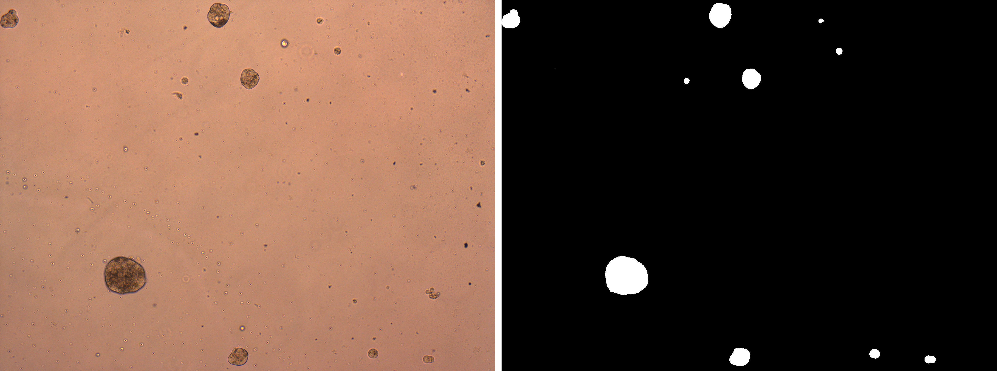

In [1]:
from IPython.display import Image
Image(filename="ejemplo_segmentacion.png")

Importamos las librerías necesarias:

In [4]:
import os
import numpy as np
import pandas as pd
from random import random
import warnings
warnings.filterwarnings("ignore")

pd.options.display.float_format = '{:,.2f}'.format

Para asociar el Drive:

In [5]:
# Si están trabajando en Colab, borrar # 
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
# os.chdir("/content/drive/My Drive/Datos_tumoresferas")
# para acceder a la carpeta, en el siguiente link:
# https://drive.google.com/drive/folders/1RqGNySwACN33Qopmw0nHmj5Yv4M78ZXi?usp=sharing

## Datos


Cargamos los datos de los experimentos realizados desde el día cero al séptimo. 


Ya se encuentran las etiquetas y el valor de las poblaciones celulares estimadas en cada esferoide.

In [13]:
url = "https://raw.githubusercontent.com/luciabarg/datos_tumoresferas/main/data/raw/fiji_datos_0al7mo_labels.csv"
fiji_datos = pd.read_csv(url) 
print('cantidad de datos:', len(fiji_datos))
fiji_datos.head()

cantidad de datos: 1018


,labels,Area,X,Y,XM,YM,Perim.,BX,BY,Width,...,FeretY,FeretAngle,MinFeret,AR,Round,Solidity,Esferoide,dia,Diameter,n_diam
0,Esferas_BT474_dia_0_well_1_100X_1_blob_1,324.44,"1,129.27",102.21,"1,129.27",102.21,67.36,"1,118.89",92.39,21.06,...,157,23.43,19.70,1.07,0.94,0.95,si,0,20.96,1.49
1,Esferas_BT474_dia_0_well_1_100X_1_blob_2,497.51,"1,517.55",126.10,"1,517.55",126.10,82.80,"1,504.76",113.45,25.82,...,192,16.14,25.13,1.05,0.95,0.96,si,0,26.00,2.85
2,Esferas_BT474_dia_0_well_1_100X_1_blob_3,282.91,"1,314.28",126.10,"1,314.28",126.10,62.16,"1,304.35",116.85,19.70,...,189,15.42,18.34,1.04,0.96,0.95,si,0,19.39,1.18
3,Esferas_BT474_dia_0_well_1_100X_1_blob_5,500.74,"1,189.28",212.62,"1,189.28",212.62,84.56,"1,175.95",200.41,26.49,...,309,174.14,25.14,1.03,0.97,0.95,si,0,25.88,2.81
4,Esferas_BT474_dia_0_well_1_100X_1_blob_6,492.90,"1,043.08",247.77,"1,043.08",247.77,82.07,"1,030.57",235.73,25.14,...,353,143.43,24.46,1.02,0.98,0.96,si,0,25.34,2.64
